<a href="https://colab.research.google.com/github/Lagc93/Senales_Y_Sistemas/blob/main/Parcial3_SyS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

1. Encuentre la funcion de transferencia que caracteriza el sistema masa, resorte, amortiguador, presentado en la siguiente Figura (asuma condiciones iniciales cero):

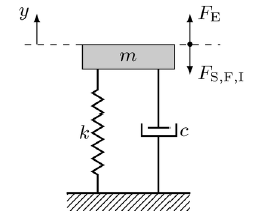

Posteriormente, encuentre el sistema equivalente del modelo masa, resorte, amortiguador, a partir del siguiente circuito electrico:

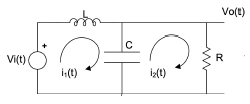

Finalmente, proponga unos valores de m, k y c y sus equivalentes R, L y C, para simular un sistema subamortiguado sobreamortiguado, y de amortiguamiento crıtico (determine el factor de amortiguamiento, la frecuencia natural amortiguada, la frecuencia natural no amortiguada, el tiempo pico, tiempo de levantamiento y el tiempo de establecimiento en cada caso). Para cada caso, grafique el diagrama de polos y
ceros, el diagrama de Bode, la respuesta impulso, respuesta escalon y respuesta rampa. Repita el proceso para modo lazo
cerrado.


In [57]:
!pip install sympy --upgrade #actualizar sympy para usar módulo de control

In [58]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

import sympy as sym
sym.init_printing()
#definiri variables
t, m, c, k = sym.symbols('t m c k', real=True,positive=True)
s = sym.symbols('s', complex=True)

Teniendo en cuenta la forma canónica:

$$H(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$H(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$


In [59]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [60]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

# Para un sistema subamortiguado

Ahora, para sistema un subamortiguado:

$$0<\xi<1$$

$$0<\frac{c}{2\sqrt{k m}}<1$$

Asumimos: $L = 1$, $R=1$, $C=4$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 1$$

$$m=CL = 4$$



$$\xi =\frac{1}{2\sqrt{1*4}}= \frac{1}{4}=0.25$$


In [61]:
#Reemplazando los valores
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

## Polos y ceros

In [62]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.484122918275927*I
p2= -0.125 - 0.484122918275927*I
xi= 0.250000000000000
omega_n= 0.500000000000000


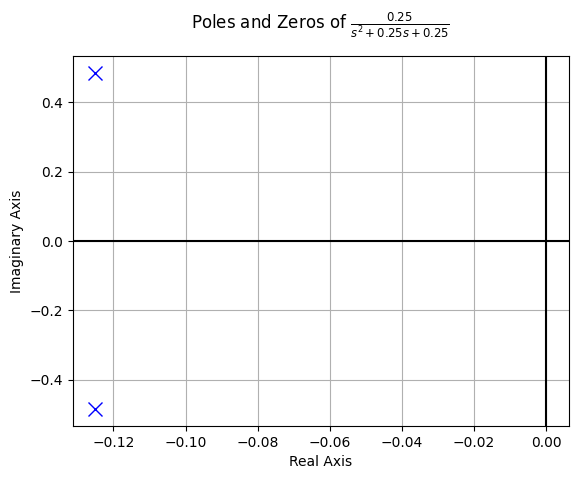

In [63]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot, ramp_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

## Diagrama de Bode

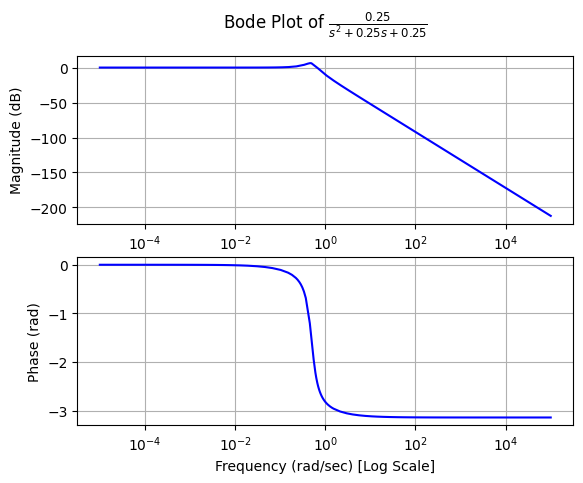

In [64]:
bode_plot(tf1)

## Respuesta impulso

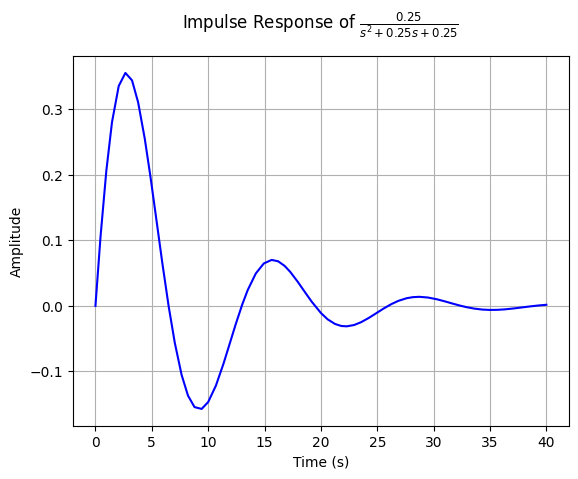

In [65]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Respuesta al escalón

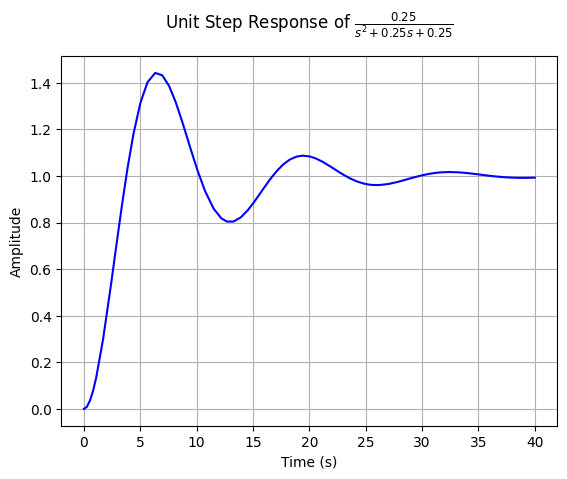

In [66]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Respuesta rampa

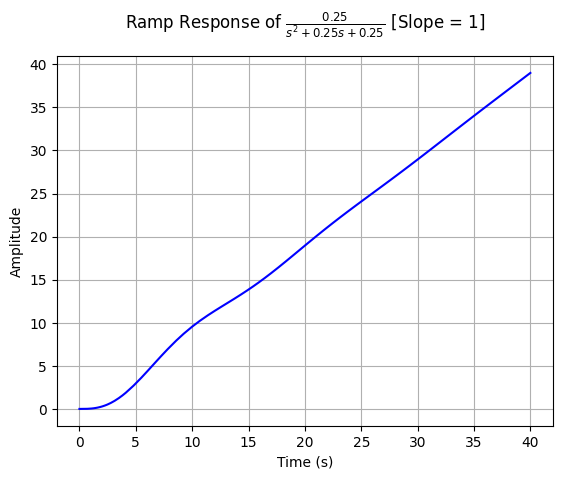

In [67]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Para un sistema sobreamortiguado

Ahora, para un sistema subamortiguado:

$$\xi>1$$

$$\frac{c}{2\sqrt{k m}}>1$$

Asumimos: $L = 10$, $R=2$, $C=0.4$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 5$$

$$m=CL = 4$$



$$\xi =\frac{5}{2\sqrt{1*4}}= \frac{5}{4}=1.25$$


In [68]:
#Reemplazando los valores
mck = {m: 4.0, c: 5.0, k: 1.0}
mck

{c: 5.0, k: 1.0, m: 4.0}

In [69]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [70]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

p1= -1.00000000000000
p2= -0.250000000000000
xi= 1.25000000000000
omega_n= 0.500000000000000


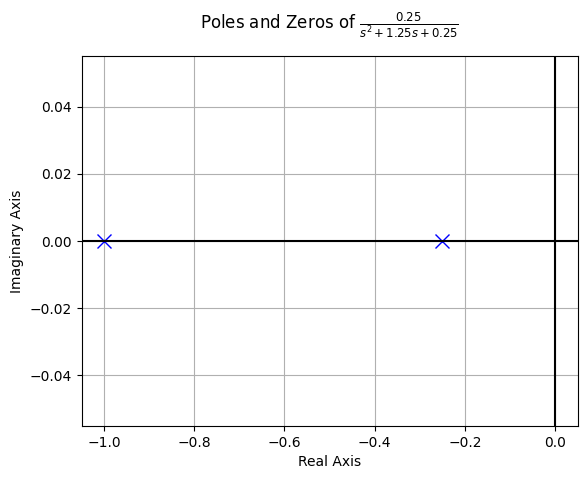

In [71]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

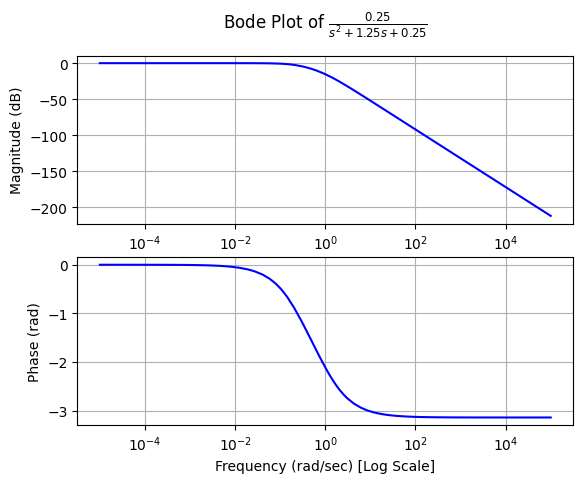

In [72]:
bode_plot(tf1)

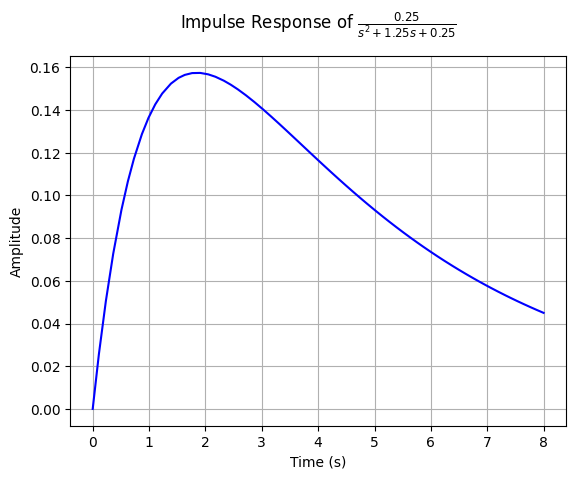

In [73]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

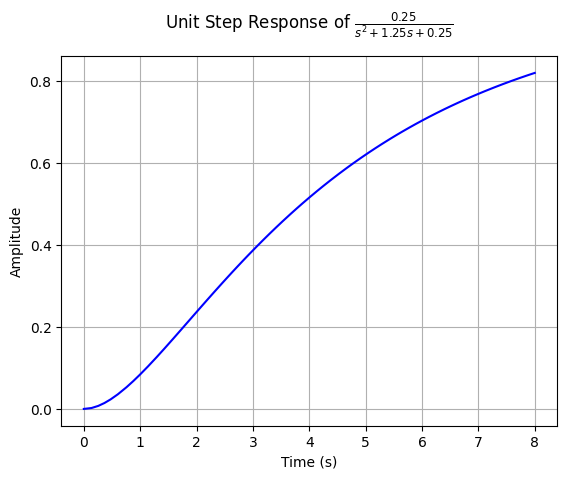

In [74]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

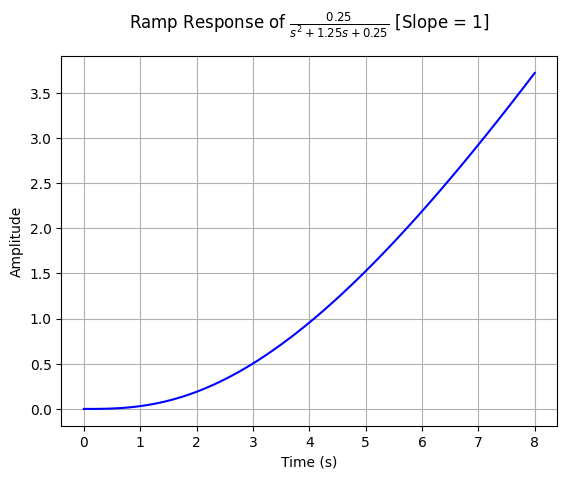

In [75]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

# Para un sistema de amortiguamiento crítico

Ahora, para un sistema de amortiguamiento crítico:

$$\xi=1$$

$$\frac{c}{2\sqrt{k m}}=1$$

Asumimos: $L = 8$, $R=2$, $C=0.5$ y calculamos los valores de m,c y k a partir de la tabla:


|                         | Circuito RLC | Péndulo elástico                          |
|-------------------------|------------------------------------|-------------------------------------------|
                            |
|                         | $CL$                              | $m$                                     |
|                         | $L/R$                              | $c$                                     |
|                         | $1$                    | $k$                           |

$$k=1$$

$$c=\frac{L}{R} = 4$$

$$m=CL = 4$$



$$\xi =\frac{4}{2\sqrt{1*4}}= 1$$


In [76]:
#Reemplazando los valores
mck = {m: 4.0, c: 4.0, k: 1.0}
mck

{c: 4.0, k: 1.0, m: 4.0}

In [77]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*sym.sqrt(ao*a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

       1        
────────────────
  ⎛c⋅s   k    2⎞
m⋅⎜─── + ─ + s ⎟
  ⎝ m    m     ⎠

In [78]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                      _____________
                     ╱      2      
                    ╱      c       
        1.0⋅ⅈ⋅√k⋅  ╱   - ───── + 1 
   c             ╲╱      4⋅k⋅m     
- ─── + ───────────────────────────
  2⋅m                √m            

p1= -0.500000000000000
p2= -0.500000000000000
xi= 1.00000000000000
omega_n= 0.500000000000000


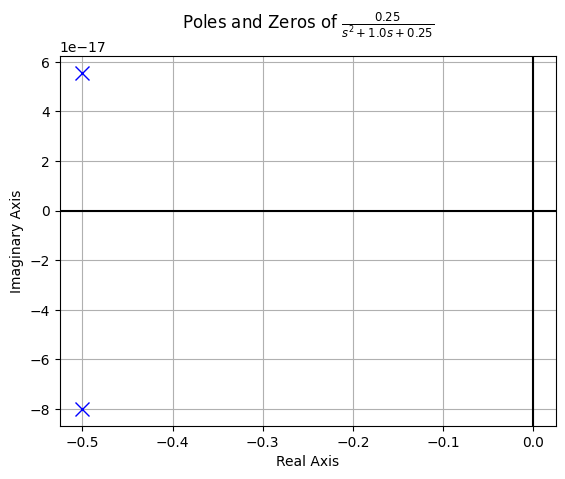

In [79]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf1 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf1)

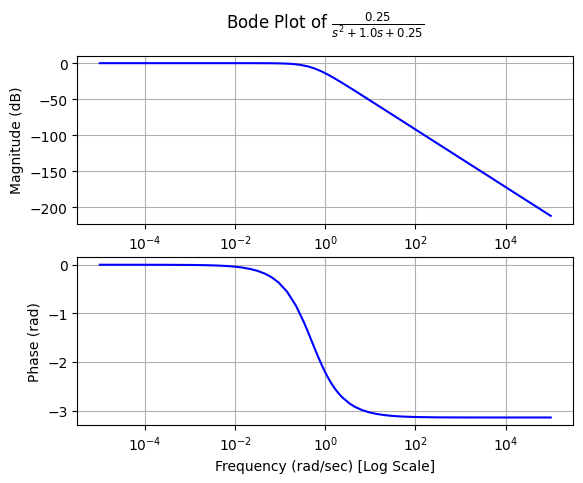

In [80]:
bode_plot(tf1)

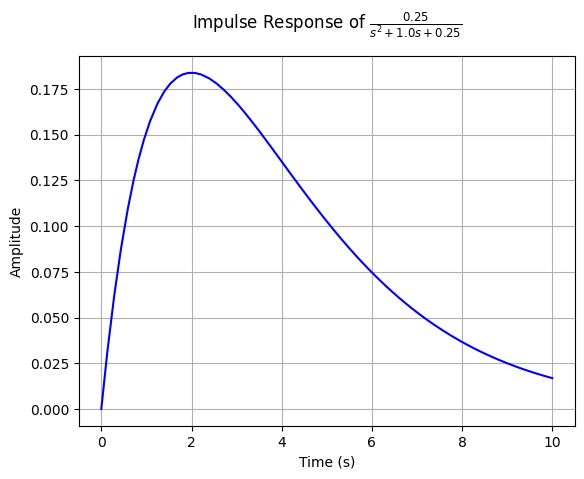

In [81]:
impulse_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

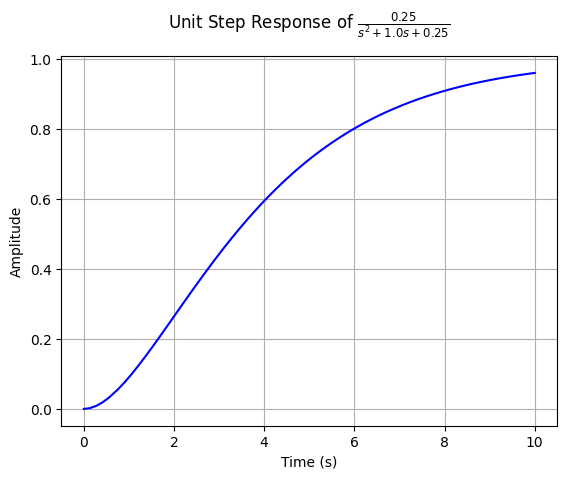

In [82]:
step_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

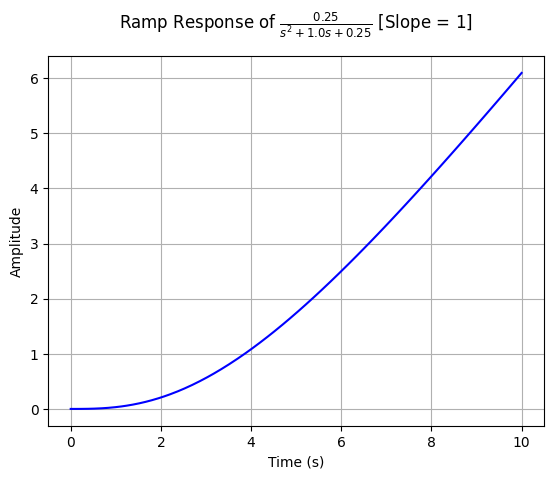

In [83]:
ramp_response_plot(tf1,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

#Función de transferencia para masa resorte amortiguado lazo cerrado

Teniendo en cuenta la forma canónica:

$$HLC(s)=\frac{1}{a_2s^2+a_1s+a_0}$$

$$HLC(s)=K\frac{\omega_n^2}{s^2+2\xi \omega_ns+\omega_n^2}$$

In [84]:
#forma canónica del slit
a2 = m #CL en circuito equivalente
a1 = c #L/R en circuito equivalente
ao = k+1 # 1 en circuito equivalente

Ko = 1/ao #ganancia circuito forma canónica
wn = sym.sqrt(ao/a2)
xi = a1/(2*a2*sym.sqrt(ao/a2))
#función de transferencia
H = Ko*wn**2/(s**2+2*xi*wn*s+wn**2)
H

         1          
────────────────────
  ⎛c⋅s    2   k + 1⎞
m⋅⎜─── + s  + ─────⎟
  ⎝ m           m  ⎠

In [85]:
#calcular polos
p1 = -xi*wn + 1j*wn*sym.sqrt(1-xi**2)
p2 = -xi*wn - 1j*wn*sym.sqrt(1-xi**2)
p1

                             ___________________
                            ╱         2         
                _______    ╱         c          
        1.0⋅ⅈ⋅╲╱ k + 1 ⋅  ╱   - ─────────── + 1 
   c                    ╲╱      4⋅m⋅(k + 1)     
- ─── + ────────────────────────────────────────
  2⋅m                      √m                   

Ahora, para sistema subamortiguado:

$$0<\xi<1$$

$$0<\frac{c}{2 m\sqrt{\frac{k+1} {m}}}<1$$

Asumimos:

$$c=1 = \frac{L}{R}$$

$L = 1$, $R=1$

$$k=1$$

$$m=4 = CL$$

$C=4$

$$\xi = \frac{\sqrt{2}}8 =0.17$$

In [86]:
#Reemplazando los valores
mck = {m: 4.0, c: 1.0, k: 1.0}
mck

{c: 1.0, k: 1.0, m: 4.0}

## Polos y ceros

In [87]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -0.125 + 0.695970545353753*I
p2= -0.125 - 0.695970545353753*I
xi= 0.176776695296637
omega_n= 0.707106781186548


## Tiempo de Establecimiento:

In [88]:
t_s3 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s3.subs(mck))

El tiempo de establecimiento es de:  24.0000000000000


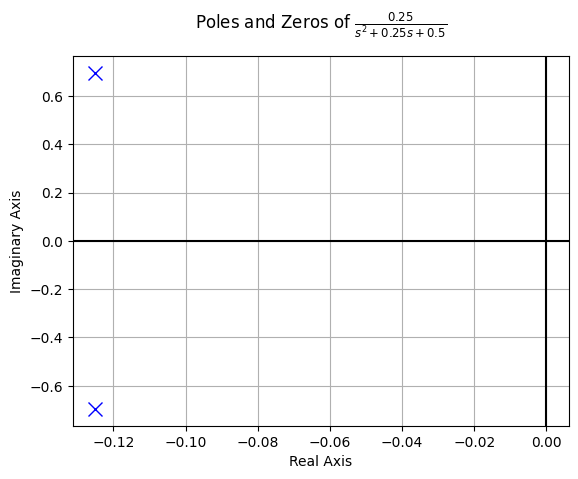

In [89]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf3 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf3)

## Diagrama de Bode

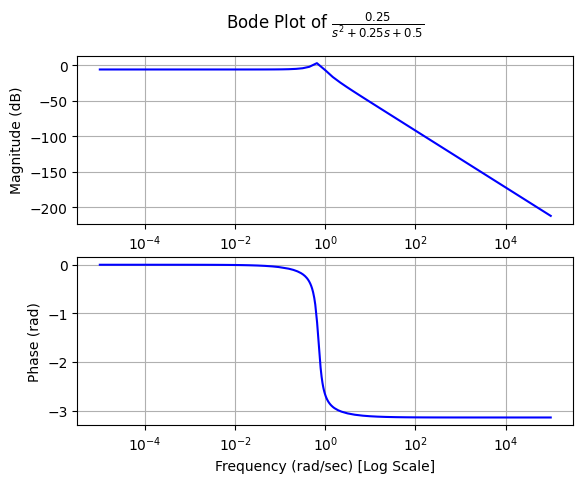

In [90]:
bode_plot(tf3)

## Respuesta impulso

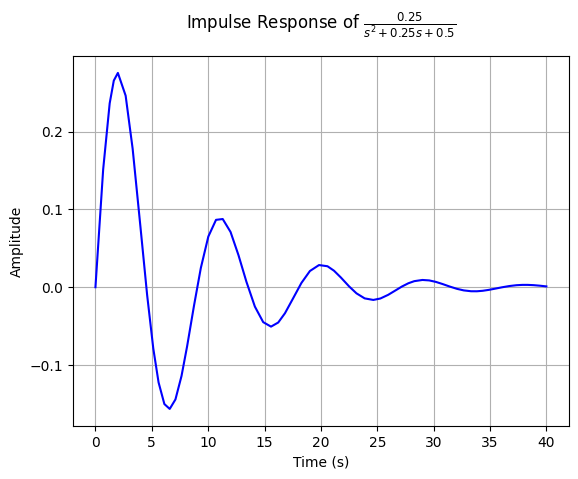

In [91]:
impulse_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

2.262626262626263

# Respuesta al escalón

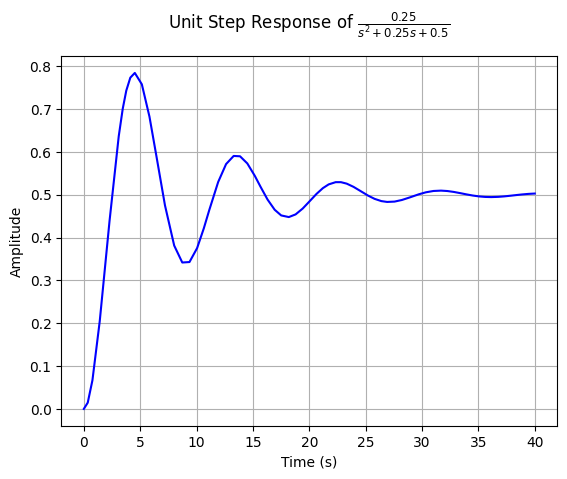

In [93]:
step_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

In [94]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import step, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [4, 1, 2]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = step((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

4.525252525252526

## Respuesta Rampa

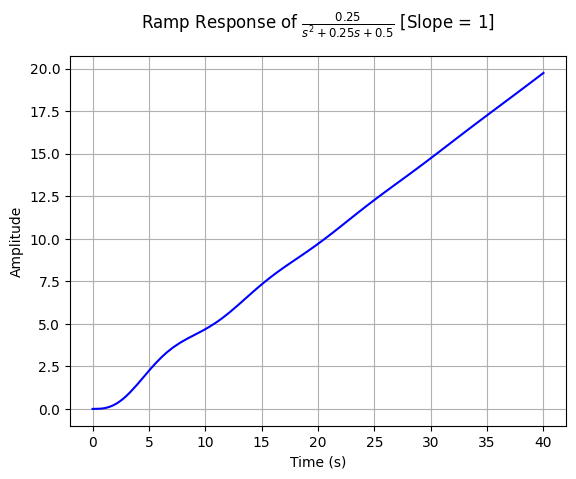

In [95]:
ramp_response_plot(tf3,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

Ahora, para sistema de amortiguamiento crítico:

$$\xi=1$$

$$\frac{c}{2 m\sqrt{\frac{k+1} {m}}}=1$$

Asumimos:

$$c=4 = \frac{L}{R}$$

$L = 8$, $R=2$

$$k=1$$

$$m=2 = CL$$

$C=\frac{1}{4}$

$$\xi = \frac{4}{4}=1$$

In [96]:
#Reemplazando los valores
mck = {m: 2.0, c: 4.0, k: 1.0}
mck

{c: 4.0, k: 1.0, m: 2.0}

## Polos y ceros

In [97]:
print('p1=',p1.subs(mck))
print('p2=',p2.subs(mck))
print('xi=',xi.subs(mck))
print('omega_n=',wn.subs(mck))

p1= -1.00000000000000
p2= -1.00000000000000
xi= 1.00000000000000
omega_n= 1.00000000000000


## Tiempo de Establecimiento:

In [98]:
t_s4 = 6*m / c
print('El tiempo de establecimiento es de: ',t_s4.subs(mck))

El tiempo de establecimiento es de:  3.00000000000000


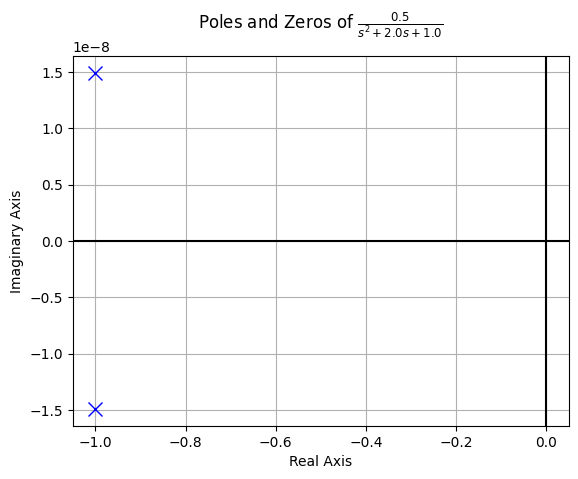

In [99]:
#gráfica polos y ceros paquete de control de sympy
from sympy.physics.control.lti import TransferFunction
from sympy.physics.control.control_plots import pole_zero_plot, bode_plot, impulse_response_plot, step_response_plot
num,den=sym.fraction(H.subs(mck))

tf4 = TransferFunction(num, den, s)#numerados y denomirador función de transferencia con valores evaluados de RLC
pole_zero_plot(tf4)

## Diagrama de Bode

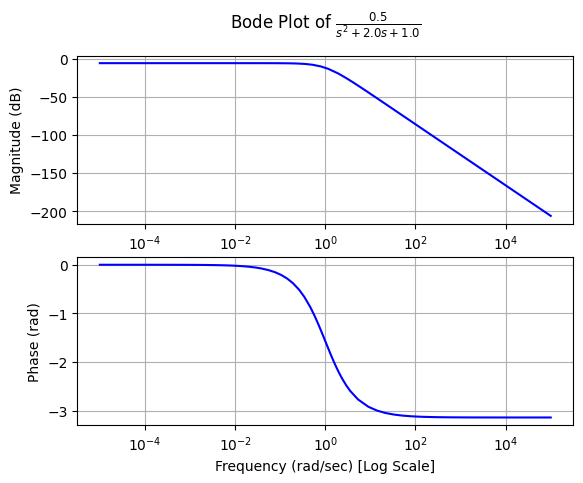

In [100]:
bode_plot(tf4)

## Respuesta impulso

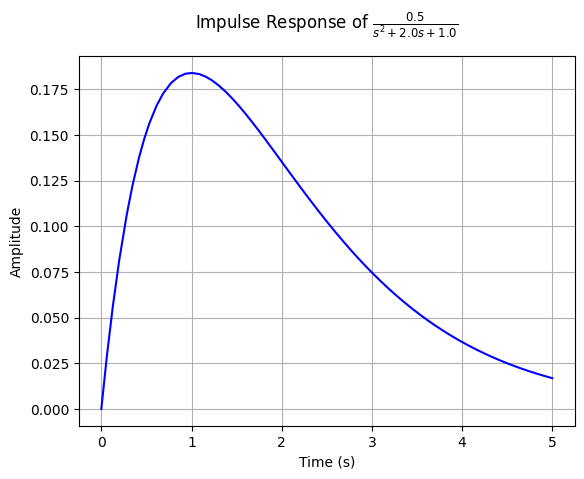

In [101]:
impulse_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

In [102]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import impulse, find_peaks

# Suponiendo que tf1 es tu función de transferencia
# (asegúrate de tener importada la función transfer_function)

# Definir la función de transferencia (sustituye tf1 con tu función)
numerator = [1]
denominator = [2, 4, 1]  # Sistema de segundo orden, por ejemplo

# Obtener la respuesta al impulso
time, response = impulse((numerator, denominator))

# Encontrar los picos en la respuesta al impulso
peaks, _ = find_peaks(response)

# Encontrar el tiempo correspondiente al primer pico
Tp = time[peaks[0]]
Tp

1.207045198818771

# Respuesta al escalón

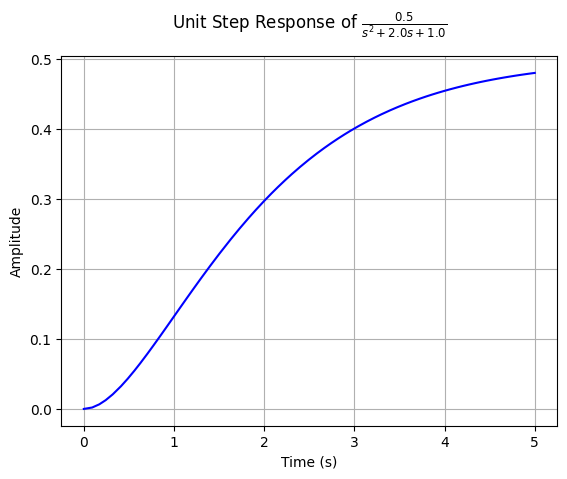

In [103]:
step_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

## Respuesta Rampa

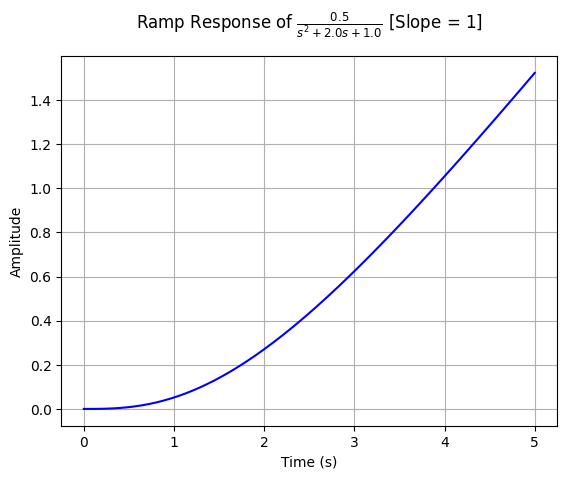

In [104]:
ramp_response_plot(tf4,upper_limit=5/(xi.subs(mck)*wn.subs(mck)))

2. Sea el demodulador en amplitud presentado
en la siguiente Figura:

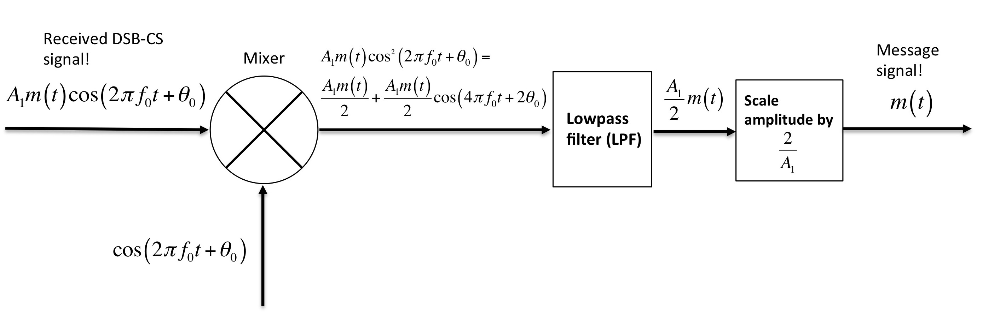


Asumiendo  $\theta_0 = 0$, determine el espectro en cada una de las etapas del sistema. Luego, con base a la simulacion de
la modulacion en amplitud del parcial 2 (utilizando una cancion de Youtube), grafique cada una de las etapas principales del proceso de modulacion y demodulacion en el tiempo y la frecuencia (reproduzca el segmento de la cancion en cada etapa). Nota: para la etapa de filtrado pasa bajas, presente
el diseño del filtro y su implementacion a partir de la transformada Z utilizando un modelo Butterworth, Bessel y
Chebyshev.

In [105]:
import soundfile as sf
import scipy
import numpy as np

from scipy.signal import butter, filtfilt
from scipy.io import wavfile
from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import bessel
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [106]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz (2.5 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached mutagen-1.47.0-py3-none-any.whl (194 kB)
  Using cached pycryptodomex-3.19.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached websockets-12.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (130 kB)
  Using cached certifi-2023.11.17-py3-none-any.whl (162 kB)
  Using cached requests-2.31.0-py3-none-any.whl (62 kB)
  Using cached urllib3-2.1.0-py3-none-any.whl (104 kB)
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (3.0 MB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (142 kB)
  Using cached idna-3.6-py3-none-

In [107]:
import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [108]:
link_= ["https://www.youtube.com/watch?v=KwUV42OVDhI"]
name_ = ['Porque te amo - Nino Segarra'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Porque te amo - Nino Segarra
[youtube] Extracting URL: https://www.youtube.com/watch?v=KwUV42OVDhI
[youtube] KwUV42OVDhI: Downloading webpage
[youtube] KwUV42OVDhI: Downloading ios player API JSON
[youtube] KwUV42OVDhI: Downloading android player API JSON
[youtube] KwUV42OVDhI: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=KwUV42OVDhI
[youtube] KwUV42OVDhI: Downloading webpage
[youtube] KwUV42OVDhI: Downloading ios player API JSON
[youtube] KwUV42OVDhI: Downloading android player API JSON
[youtube] KwUV42OVDhI: Downloading m3u8 information
[info] KwUV42OVDhI: Downloading 1 format(s): 251
[download] Porque te amo - Nino Segarra.mp3 has already been downloaded
[download] 100% of    5.37MiB
Download complete... Porque te amo - Nino Segarra.mp3


In [109]:
# Instalamos la extensión soundfile
!pip install soundfile

In [110]:
import subprocess
for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [111]:
import soundfile as sf
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()
inicial =  15
final =  25

corte1= 7000
corte2= 12000

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs)

Frecuencia de muestreo 48000.00[Hz]
audio Porque te amo - Nino Segarra.wav
Frecuencia de muestreo 48000.00[Hz]
Audio original:


In [112]:
filtrado="bandpass"
N_orden=6

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


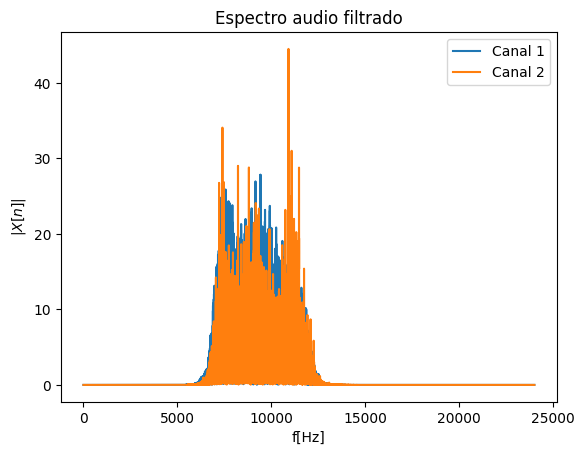

In [113]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [114]:
filtrado="bandpass"
N_orden=2
ripple=7

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


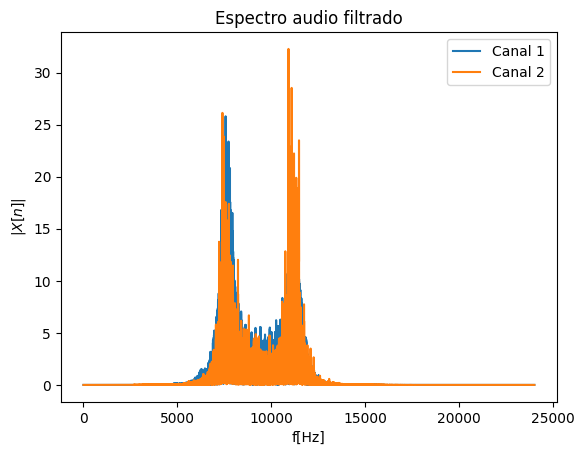

In [115]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [116]:
filtrado="bandpass"
N_orden=6
normali="mag"

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado:


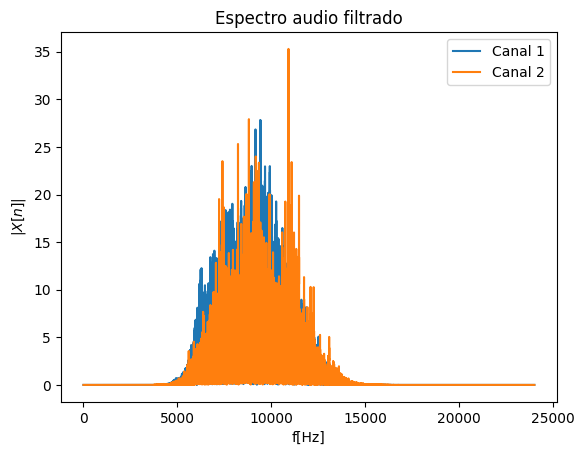

In [117]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()